In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('data/WhoCovid19GlobalData.csv')
df

,Date_reported,Country_code,Country,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
0,2020-01-03,AF,Afghanistan,EMRO,0,0,0,0
1,2020-01-04,AF,Afghanistan,EMRO,0,0,0,0
2,2020-01-05,AF,Afghanistan,EMRO,0,0,0,0
3,2020-01-06,AF,Afghanistan,EMRO,0,0,0,0
4,2020-01-07,AF,Afghanistan,EMRO,0,0,0,0
...,...,...,...,...,...,...,...,...
74725,2020-11-11,ZW,Zimbabwe,AFRO,49,8610,1,255
74726,2020-11-12,ZW,Zimbabwe,AFRO,57,8667,0,255
74727,2020-11-13,ZW,Zimbabwe,AFRO,29,8696,0,255
74728,2020-11-14,ZW,Zimbabwe,AFRO,69,8765,2,257


In [3]:
df.columns

Index(['Date_reported', ' Country_code', ' Country', ' WHO_region',
       ' New_cases', ' Cumulative_cases', ' New_deaths', ' Cumulative_deaths'],
      dtype='object')

In [4]:
df[df['Date_reported']=='2020-01-20'][' Cumulative_cases'].unique()

array([  0, 202,   1,   5,   6], dtype=int64)

In [5]:
df = df[[' Country', 'Date_reported', ' Cumulative_cases']]
df

,Country,Date_reported,Cumulative_cases
0,Afghanistan,2020-01-03,0
1,Afghanistan,2020-01-04,0
2,Afghanistan,2020-01-05,0
3,Afghanistan,2020-01-06,0
4,Afghanistan,2020-01-07,0
...,...,...,...
74725,Zimbabwe,2020-11-11,8610
74726,Zimbabwe,2020-11-12,8667
74727,Zimbabwe,2020-11-13,8696
74728,Zimbabwe,2020-11-14,8765


In [6]:
top_10_by_date = df.sort_values(by=[' Cumulative_cases'], axis=0, ascending=False).groupby('Date_reported').head(10)


In [7]:
top_10_by_date[top_10_by_date['Date_reported']=='2020-01-03']

,Country,Date_reported,Cumulative_cases
67416,Tokelau,2020-01-03,0
16536,Cyprus,2020-01-03,0
16218,Curaçao,2020-01-03,0
67734,Tonga,2020-01-03,0
17490,Democratic Republic of the Congo,2020-01-03,0
66780,Timor-Leste,2020-01-03,0
17172,Democratic People's Republic of Korea,2020-01-03,0
16854,Czechia,2020-01-03,0
67098,Togo,2020-01-03,0
14946,Costa Rica,2020-01-03,0


In [8]:
data_set = top_10_by_date.sort_values(by=['Date_reported', ' Cumulative_cases'], ascending=[True, False])
data_set

,Country,Date_reported,Cumulative_cases
67416,Tokelau,2020-01-03,0
16536,Cyprus,2020-01-03,0
16218,Curaçao,2020-01-03,0
67734,Tonga,2020-01-03,0
17490,Democratic Republic of the Congo,2020-01-03,0
...,...,...,...
63917,Spain,2020-11-15,1458591
66779,The United Kingdom,2020-11-15,1344360
2861,Argentina,2020-11-15,1296378
13991,Colombia,2020-11-15,1182697


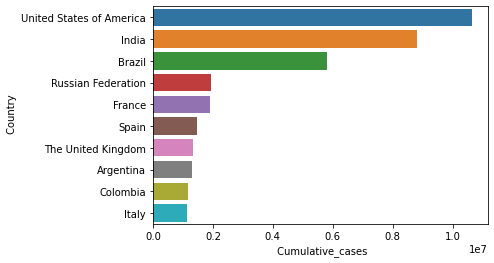

In [9]:
day_graph_data = data_set[3170:3180]
sns.barplot(data=day_graph_data, x=' Cumulative_cases', y=' Country')

In [10]:
data_list = []
for i in range(318):
    i = i * 10
    j = i + 10
    data = data_set[i : j]
    data_list.append(data)
    
data_list

[                                     Country Date_reported   Cumulative_cases
 67416                                Tokelau    2020-01-03                  0
 16536                                 Cyprus    2020-01-03                  0
 16218                                Curaçao    2020-01-03                  0
 67734                                  Tonga    2020-01-03                  0
 17490       Democratic Republic of the Congo    2020-01-03                  0
 66780                            Timor-Leste    2020-01-03                  0
 17172  Democratic People's Republic of Korea    2020-01-03                  0
 16854                                Czechia    2020-01-03                  0
 67098                                   Togo    2020-01-03                  0
 14946                             Costa Rica    2020-01-03                  0,
                                      Country Date_reported   Cumulative_cases
 13357                                  China    20

In [11]:
def draw_barchart(i):
    data = data_list[i]
    sns.barplot(data=data, x=' Cumulative_cases', y=' Country')

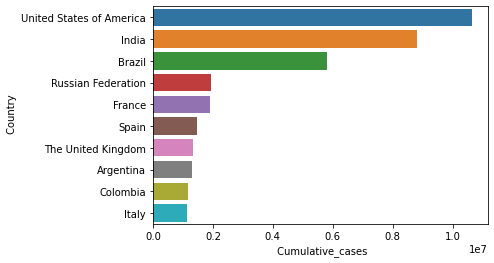

In [12]:
draw_barchart(317)

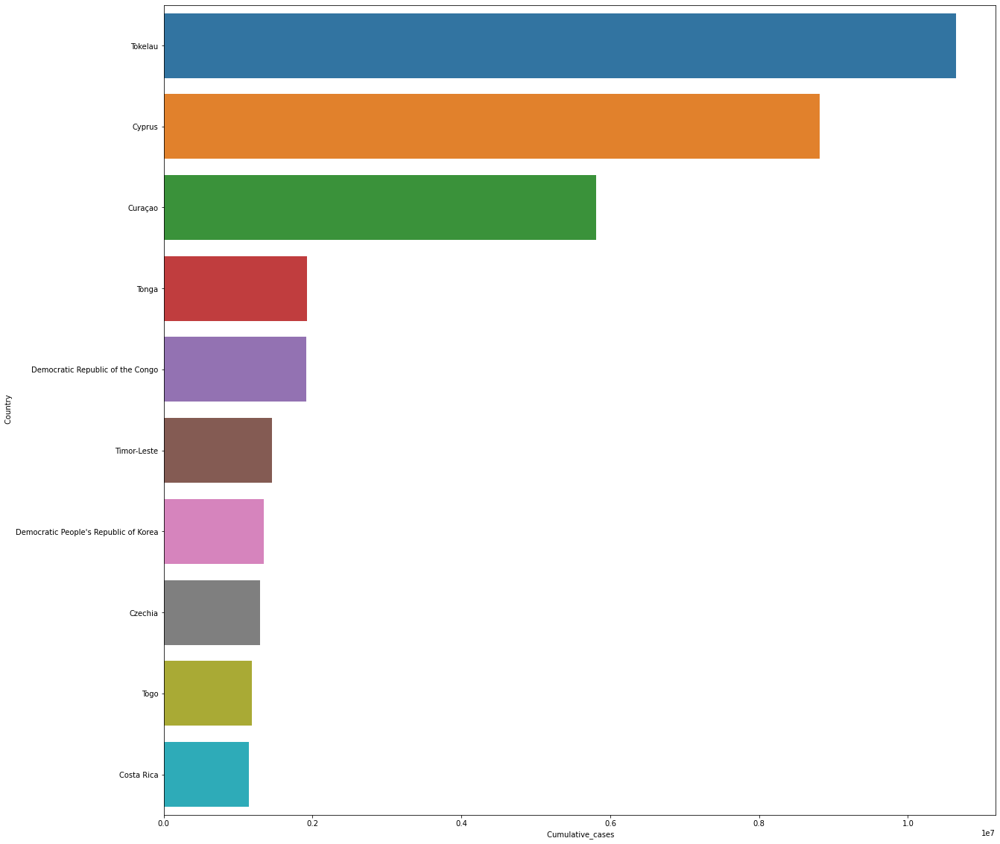

In [13]:
import matplotlib.animation as animation
from IPython.display import HTML
fig, ax = plt.subplots(figsize=(20, 20))
animator = animation.FuncAnimation(fig, draw_barchart, frames=range(318))
HTML(animator.to_jshtml())